Decision Tree Classifier

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree

In [2]:
data = pd.read_csv('F:/Prodigy internship/Task 3/Bank-fullnew.csv')
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,18,student,single,primary,no,1944,no,no,telephone,10,aug,122,3,-1,0,unknown,no
1,18,student,single,unknown,no,108,no,no,cellular,10,aug,167,1,-1,0,unknown,yes
2,18,student,single,primary,no,608,no,no,cellular,12,aug,267,1,-1,0,unknown,yes
3,18,student,single,unknown,no,35,no,no,telephone,21,aug,104,2,-1,0,unknown,no
4,18,student,single,secondary,no,5,no,no,cellular,24,aug,143,2,-1,0,unknown,no


In [3]:
data.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [4]:
data.describe()
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [5]:
# Converting categorical to dummy variables
data = pd.get_dummies(data, drop_first=True)
data.head()

,age,balance,day,duration,campaign,pdays,previous,job_blue-collar,job_entrepreneur,job_housemaid,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_other,poutcome_success,poutcome_unknown,y_yes
0,18,1944,10,122,3,-1,0,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1,18,108,10,167,1,-1,0,False,False,False,...,False,False,False,False,False,False,False,False,True,True
2,18,608,12,267,1,-1,0,False,False,False,...,False,False,False,False,False,False,False,False,True,True
3,18,35,21,104,2,-1,0,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,18,5,24,143,2,-1,0,False,False,False,...,False,False,False,False,False,False,False,False,True,False


In [6]:
#defining target variable and feature set
x=data.drop('y_yes', axis=1)
y=data['y_yes']
#Spliting the data into training and testing set
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

In [7]:
#Building decision tree
clfr=DecisionTreeClassifier(random_state=42)

#Training the classifier
clfr.fit(x_train,y_train)

DecisionTreeClassifier(random_state=42)

In [8]:
#Making predictions on the test set
y_pred = clfr.predict(x_test)

In [9]:
#calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.87


In [10]:
#Generating classification report
report = classification_report(y_test, y_pred)
print('Classification Report:\n', report)

Classification Report:
               precision    recall  f1-score   support

       False       0.93      0.93      0.93      7982
        True       0.44      0.44      0.44      1061

    accuracy                           0.87      9043
   macro avg       0.68      0.68      0.68      9043
weighted avg       0.87      0.87      0.87      9043



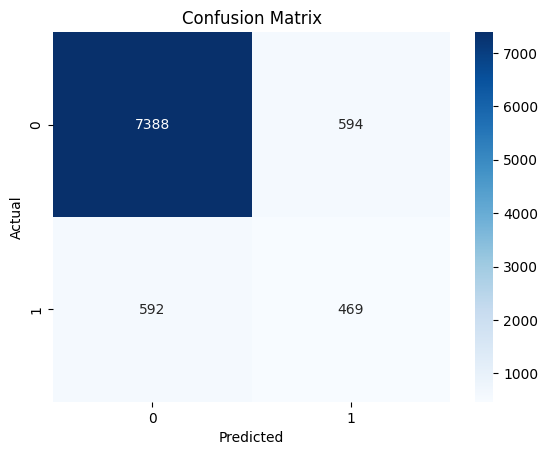

In [11]:
#Generating a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

#ploting the confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [13]:
#plottng the Decision Tree
plt.figure(figsize=(200,100))
plot_tree(clfr, filled=True, feature_names=x.columns, class_names=['No', 'Yes'], rounded=True, fontsize=10)
plt.savefig('Decisiontree.png')
plt.show()